<h1 style="text-align:center;">Attribute Information:</h1>

<br><h2 style="text-align:center;"> Bank client data: </h2><br>
1 - age (numeric)

2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')

3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)

4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')

5 - default: has credit in default? (categorical: 'no','yes','unknown')

6 - housing: has housing loan? (categorical: 'no','yes','unknown')

7 - loan: has personal loan? (categorical: 'no','yes','unknown')

<br><h2 style="text-align:center;"> Related with the last contact of the current campaign: </h2><br>

8 - contact: contact communication type (categorical: 'cellular','telephone') 

9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')

10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')

11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

<br><h2 style="text-align:center;"> Other attributes: </h2><br>

12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)

14 - previous: number of contacts performed before this campaign and for this client (numeric)

15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')

<br><h2 style="text-align:center;">Social and economic context attributes</h2><br>

16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)

17 - cons.price.idx: consumer price index - monthly indicator (numeric) 

18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric) 

19 - euribor3m: euribor 3 month rate - daily indicator (numeric)

20 - nr.employed: number of employees - quarterly indicator (numeric)

<br><h3 style="text-align:center;">Output variable (desired target): </h3><br>
21 - y - has the client subscribed a term deposit? (binary: 'yes','no')

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import argmax
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import mean_squared_error
from mlxtend.evaluate import bias_variance_decomp
from sklearn.tree import DecisionTreeClassifier 
from sklearn import tree

In [2]:
df = pd.read_csv('bank/bank.csv', ';')
df

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only
  exec(code_obj, self.user_global_ns, self.user_ns)


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,30,unemployed,married,primary,no,1787,no,no,cellular,19,oct,79,1,-1,0,unknown,no
1,33,services,married,secondary,no,4789,yes,yes,cellular,11,may,220,1,339,4,failure,no
2,35,management,single,tertiary,no,1350,yes,no,cellular,16,apr,185,1,330,1,failure,no
3,30,management,married,tertiary,no,1476,yes,yes,unknown,3,jun,199,4,-1,0,unknown,no
4,59,blue-collar,married,secondary,no,0,yes,no,unknown,5,may,226,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4516,33,services,married,secondary,no,-333,yes,no,cellular,30,jul,329,5,-1,0,unknown,no
4517,57,self-employed,married,tertiary,yes,-3313,yes,yes,unknown,9,may,153,1,-1,0,unknown,no
4518,57,technician,married,secondary,no,295,no,no,cellular,19,aug,151,11,-1,0,unknown,no
4519,28,blue-collar,married,secondary,no,1137,no,no,cellular,6,feb,129,4,211,3,other,no


In [3]:
# Checking for NaN in the dataframe.
df.isna().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [4]:
# Using .describe method for basic statistics in dataframe.
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000
mean,41.170095,1422.657819,15.915284,263.961292,2.793630,39.766645,0.542579
std,10.576211,3009.638142,8.247667,259.856633,3.109807,100.121124,1.693562
min,19.000000,-3313.000000,1.000000,4.000000,1.000000,-1.000000,0.000000
25%,33.000000,69.000000,9.000000,104.000000,1.000000,-1.000000,0.000000
50%,39.000000,444.000000,16.000000,185.000000,2.000000,-1.000000,0.000000
75%,49.000000,1480.000000,21.000000,329.000000,3.000000,-1.000000,0.000000
max,87.000000,71188.000000,31.000000,3025.000000,50.000000,871.000000,25.000000


In [5]:
# Check for numeric variables in dataframe.
numeric_features = df.select_dtypes(include=[np.number])
numeric_features.columns

Index(['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous'], dtype='object')

In [6]:
# Check for categorical variables in dataframe.
categorical_features = df.select_dtypes(include=[object])
categorical_features.columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'poutcome', 'y'],
      dtype='object')

In [7]:
# Binary Encoding of categorical variables. 
df['y'].replace(['no', 'yes'], [0, 1], inplace=True)
numeric_features = df.select_dtypes(include=[np.number])

y           1.000000
duration    0.401118
previous    0.116714
pdays       0.104087
age         0.045092
balance     0.017905
day        -0.011244
campaign   -0.061147
Name: y, dtype: float64 



<AxesSubplot:title={'center':'Correlation of Numeric Features with Answer'}>

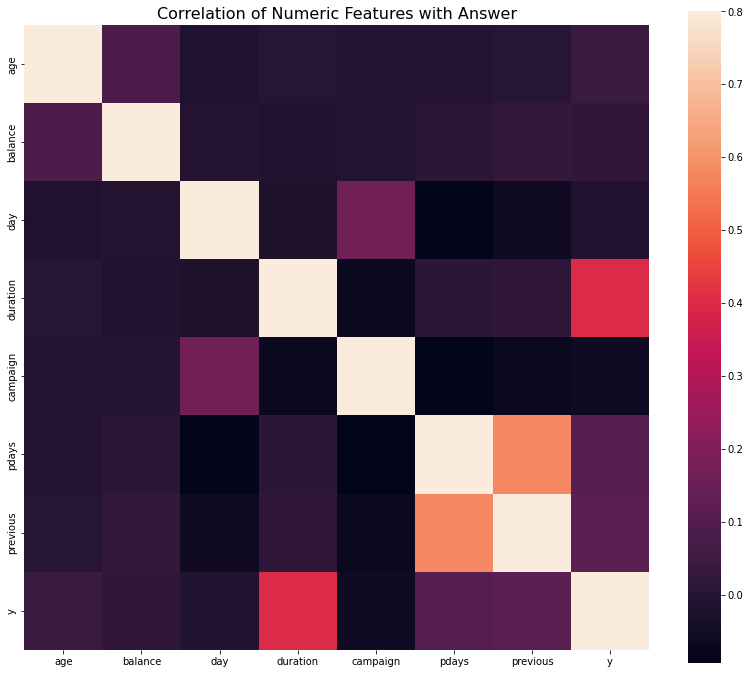

In [8]:
# Corellation coefficents and heatmap graph.
correlation = numeric_features.corr()
print(correlation['y'].sort_values(ascending = False),'\n')

f , ax = plt.subplots(figsize = (14,12))
plt.title('Correlation of Numeric Features with Answer',y=1,size=16)
sns.heatmap(correlation,square = True,  vmax=0.8)

<br><h1> Exploratory Data Analysis </h1>

In [9]:
# Graph Style Kernel.
plot_colors = ['lightskyblue', 'gold', 'lightcoral', 'gainsboro', 'royalblue','lightpink',\
               'darkseagreen', 'sienna', 'khaki', 'gold', 'violet', 'yellowgreen']
plt.style.use('seaborn')
pd.set_option("display.max_rows", None, "display.max_columns", None)

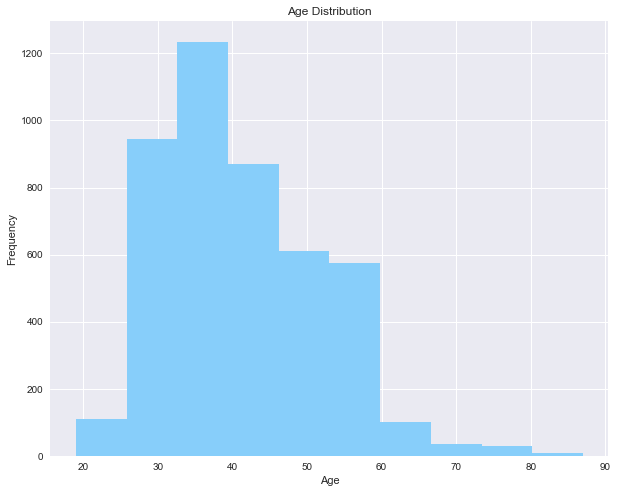

In [10]:
ax = plt.figure(figsize=(10,8))
plt.hist(df['age'], color=plot_colors[0])

plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.savefig('charts/eda/age_hist.png')
plt.show()


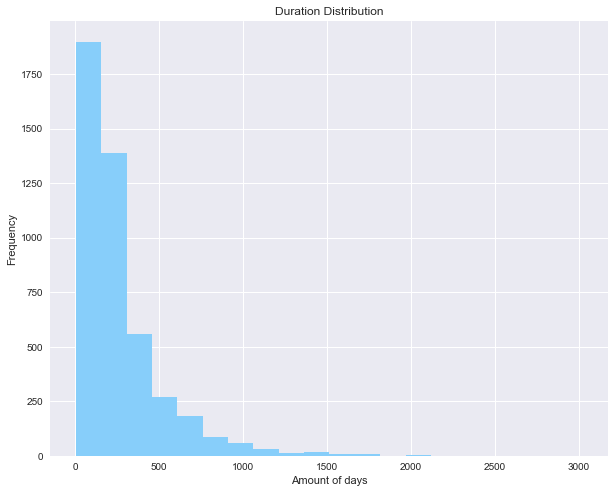

In [11]:
ax = plt.figure(figsize=(10,8))
plt.hist(df['duration'], color=plot_colors[0], bins=20)

plt.title('Duration Distribution')
plt.xlabel('Amount of days')
plt.ylabel('Frequency')
plt.savefig('charts/eda/duration_hist.png')
plt.show()

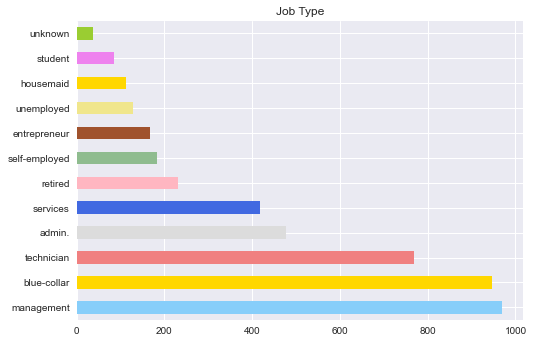

In [12]:
plot_colors = ['lightskyblue', 'gold', 'lightcoral', 'gainsboro', 'royalblue', 'lightpink', 'darkseagreen', 'sienna', 'khaki', 'gold', 'violet', 'yellowgreen']
df.job.value_counts().plot(kind = 'barh', color=plot_colors)
plt.title('Job Type')
plt.savefig('charts/eda/job_type_count.png')
plt.show()

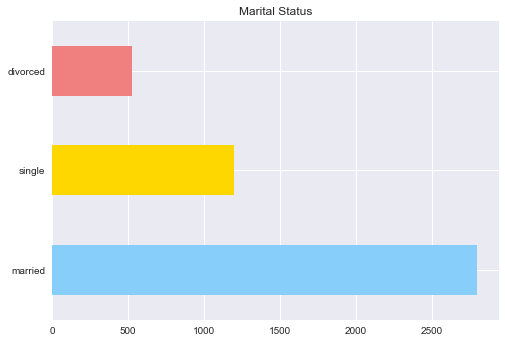

In [13]:
df.marital.value_counts().plot(kind = 'barh', color=plot_colors)
plt.title('Marital Status')
plt.savefig('charts/eda/marital_type_count.png')
plt.show()

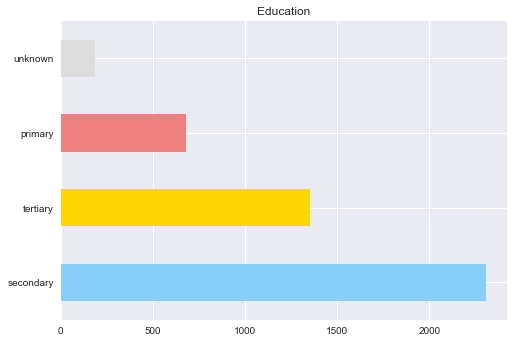

In [14]:
df.education.value_counts().plot(kind = 'barh', color=plot_colors)
plt.title('Education')
plt.savefig('charts/eda/education_count.png')
plt.show()

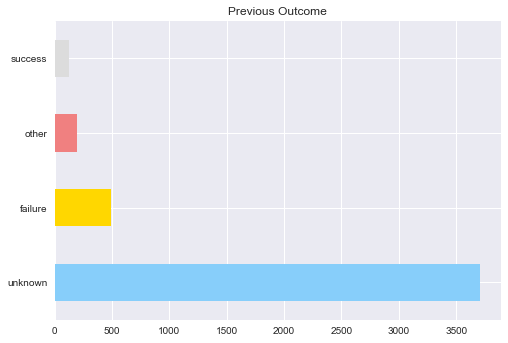

In [15]:
df.poutcome.value_counts().plot(kind = 'barh', color=plot_colors)
plt.title('Previous Outcome')
plt.savefig('charts/eda/p_outcome_count.png')
plt.show()

<h1> Crosstab Graphs </h1>
<p>Crosstabing categorical variables with 'y' in order to find possible corellation.</p>

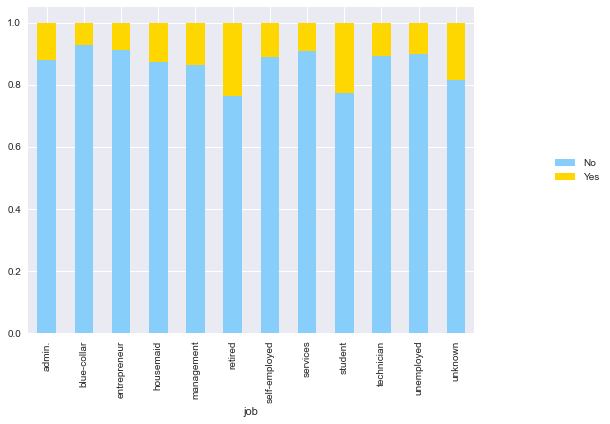

In [16]:
graph = pd.crosstab(df['job'],df['y']) 
graph.div(graph.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True,figsize=(8,6), color=plot_colors)
plt.legend(['No', 'Yes'], loc='right', bbox_to_anchor=(1.3, 0.5))
plt.savefig('charts/eda/cross_y_job.png')
plt.show()

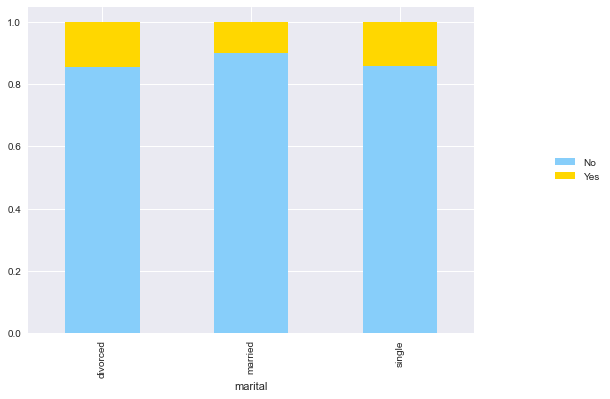

In [17]:
graph1 = pd.crosstab(df['marital'],df['y']) 
graph1.div(graph1.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True,figsize=(8,6), color=plot_colors)
plt.legend(['No', 'Yes'], loc='right', bbox_to_anchor=(1.3, 0.5))
plt.savefig('charts/eda/cross_y_marital.png')
plt.show()

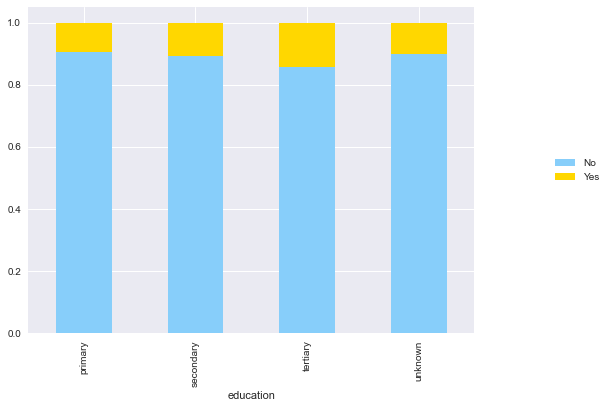

In [18]:
graph2 = pd.crosstab(df['education'],df['y']) 
graph2.div(graph2.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True,figsize=(8,6), color=plot_colors)
plt.legend(['No', 'Yes'], loc='right', bbox_to_anchor=(1.3, 0.5))
plt.savefig('charts/eda/cross_y_education.png')
plt.show()

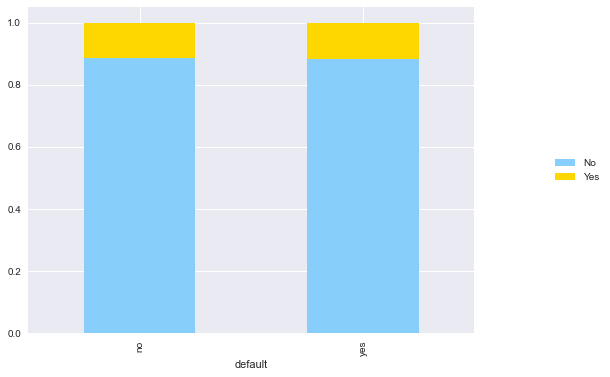

In [19]:
graph3 = pd.crosstab(df['default'],df['y']) 
graph3.div(graph3.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True,figsize=(8,6), color=plot_colors)
plt.legend(['No', 'Yes'], loc='right', bbox_to_anchor=(1.3, 0.5))
plt.savefig('charts/eda/cross_y_default.png')
plt.show()

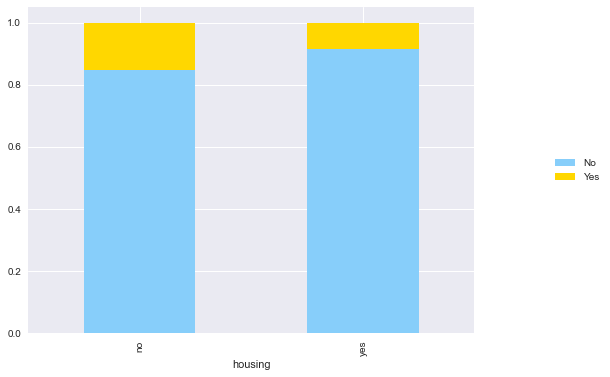

In [20]:
graph4 = pd.crosstab(df['housing'],df['y']) 
graph4.div(graph4.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True,figsize=(8,6), color=plot_colors)
plt.legend(['No', 'Yes'], loc='right', bbox_to_anchor=(1.3, 0.5))
plt.savefig('charts/eda/cross_y_housing.png')
plt.show()

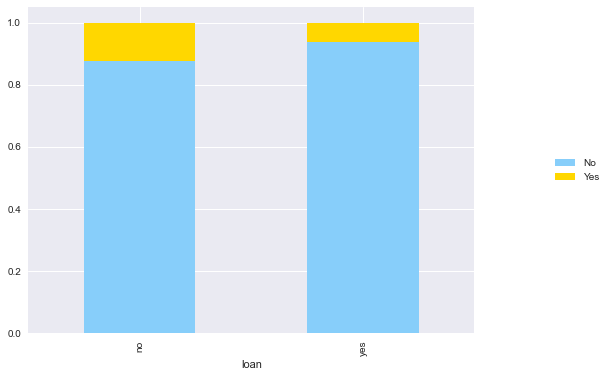

In [21]:
graph5 = pd.crosstab(df['loan'],df['y']) 
graph5.div(graph5.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True,figsize=(8,6), color=plot_colors)
plt.legend(['No', 'Yes'], loc='right', bbox_to_anchor=(1.3, 0.5))
plt.savefig('charts/eda/cross_y_loan.png')
plt.show()

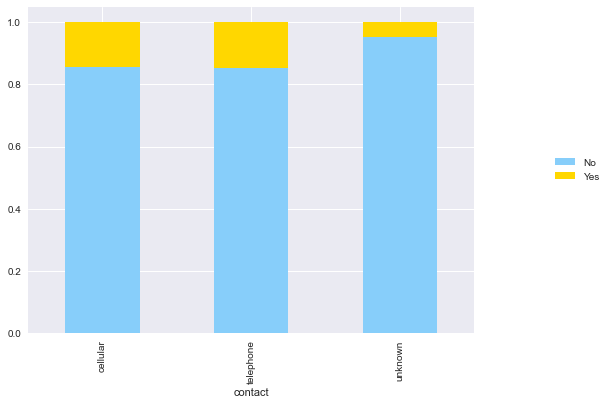

In [22]:
graph6 = pd.crosstab(df['contact'],df['y']) 
graph6.div(graph6.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True,figsize=(8,6), color=plot_colors)
plt.legend(['No', 'Yes'], loc='right', bbox_to_anchor=(1.3, 0.5))
plt.savefig('charts/eda/cross_y_contact.png')
plt.show()

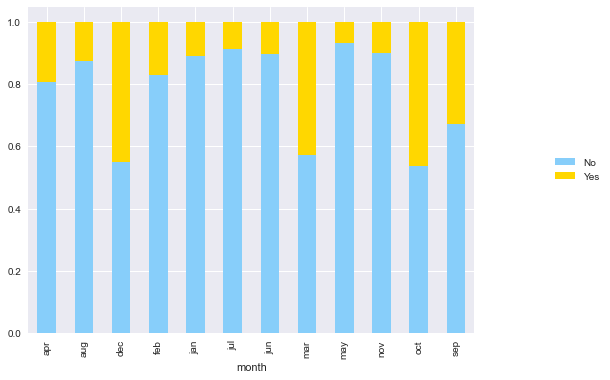

In [23]:
graph7 = pd.crosstab(df['month'],df['y']) 
graph7.div(graph7.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True,figsize=(8,6), color=plot_colors)
plt.legend(['No', 'Yes'], loc='right', bbox_to_anchor=(1.3, 0.5))
plt.savefig('charts/eda/cross_y_month.png')
plt.show()

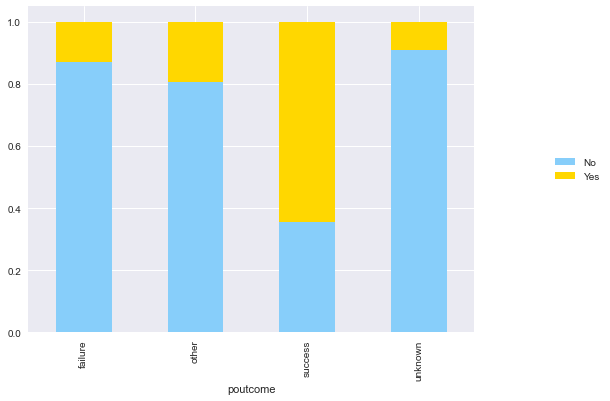

In [24]:
graph8 = pd.crosstab(df['poutcome'],df['y']) 
graph8.div(graph8.sum(1).astype(float), axis=0).plot(kind="bar",stacked=True,figsize=(8,6), color=plot_colors)
plt.legend(['No', 'Yes'], loc='right', bbox_to_anchor=(1.3, 0.5))
plt.savefig('charts/eda/cross_y_poutcome.png')
plt.show()

<br><h2> Feature Engineering</h2>

In [25]:
# Looping through unique values in categorical columns.
for col in categorical_features:
    print(col, pd.unique(categorical_features[col]))


job ['unemployed' 'services' 'management' 'blue-collar' 'self-employed'
 'technician' 'entrepreneur' 'admin.' 'student' 'housemaid' 'retired'
 'unknown']
marital ['married' 'single' 'divorced']
education ['primary' 'secondary' 'tertiary' 'unknown']
default ['no' 'yes']
housing ['no' 'yes']
loan ['no' 'yes']
contact ['cellular' 'unknown' 'telephone']
month ['oct' 'may' 'apr' 'jun' 'feb' 'aug' 'jan' 'jul' 'nov' 'sep' 'mar' 'dec']
poutcome ['unknown' 'failure' 'other' 'success']
y ['no' 'yes']


In [26]:
# Label Encoding approach.

df['default'].replace(['no', 'yes'], [0, 1], inplace=True)
df['housing'].replace(['no', 'yes'], [0, 1], inplace=True)
df['loan'].replace(['no', 'yes'], [0, 1], inplace=True)

numeric_features = df.select_dtypes(include=[np.number])

df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,30,unemployed,married,primary,0,1787,0,0,cellular,19,oct,79,1,-1,0,unknown,0
1,33,services,married,secondary,0,4789,1,1,cellular,11,may,220,1,339,4,failure,0
2,35,management,single,tertiary,0,1350,1,0,cellular,16,apr,185,1,330,1,failure,0
3,30,management,married,tertiary,0,1476,1,1,unknown,3,jun,199,4,-1,0,unknown,0
4,59,blue-collar,married,secondary,0,0,1,0,unknown,5,may,226,1,-1,0,unknown,0
5,35,management,single,tertiary,0,747,0,0,cellular,23,feb,141,2,176,3,failure,0
6,36,self-employed,married,tertiary,0,307,1,0,cellular,14,may,341,1,330,2,other,0
7,39,technician,married,secondary,0,147,1,0,cellular,6,may,151,2,-1,0,unknown,0
8,41,entrepreneur,married,tertiary,0,221,1,0,unknown,14,may,57,2,-1,0,unknown,0
9,43,services,married,primary,0,-88,1,1,cellular,17,apr,313,1,147,2,failure,0


y           1.000000
duration    0.401118
previous    0.116714
pdays       0.104087
age         0.045092
balance     0.017905
default     0.001303
day        -0.011244
campaign   -0.061147
loan       -0.070517
housing    -0.104683
Name: y, dtype: float64 



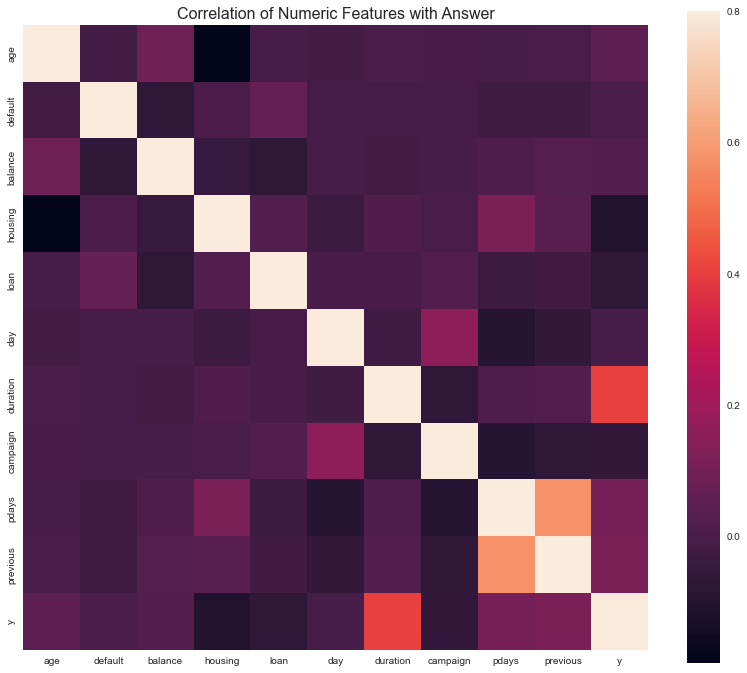

In [27]:
# Corellation coefficents and heatmap graph with all binominal categorical and numerical features.
correlation = numeric_features.corr()
print(correlation['y'].sort_values(ascending = False),'\n')

f , ax = plt.subplots(figsize = (14,12))
plt.title('Correlation of Numeric Features with Answer',y=1,size=16)
sns.heatmap(correlation,square = True,  vmax=0.8)
plt.savefig('charts/eda/corr_heatmap.png')

In [28]:
dummie_data = pd.get_dummies(df, columns=['job', 'marital','education', 'contact','month','poutcome'], drop_first=True)
dummie_data

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,y,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown,marital_married,marital_single,education_secondary,education_tertiary,education_unknown,contact_telephone,contact_unknown,month_aug,month_dec,month_feb,month_jan,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success,poutcome_unknown
0,30,0,1787,0,0,19,79,1,-1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,33,0,4789,1,1,11,220,1,339,4,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,35,0,1350,1,0,16,185,1,330,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,30,0,1476,1,1,3,199,4,-1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1
4,59,0,0,1,0,5,226,1,-1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1
5,35,0,747,0,0,23,141,2,176,3,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
6,36,0,307,1,0,14,341,1,330,2,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
7,39,0,147,1,0,6,151,2,-1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
8,41,0,221,1,0,14,57,2,-1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1
9,43,0,-88,1,1,17,313,1,147,2,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [29]:
y = dummie_data.y # Target variable
X = dummie_data.drop('y',axis=1) # Features

<br><h2>Logistic Regression</h2>

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)
logreg = LogisticRegression(random_state=0, max_iter=5000)
logreg.fit(X_train, y_train)

LogisticRegression(max_iter=5000, random_state=0)

In [31]:
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.90


In [32]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.8974358974358975
Precision: 0.6617647058823529
Recall: 0.32608695652173914


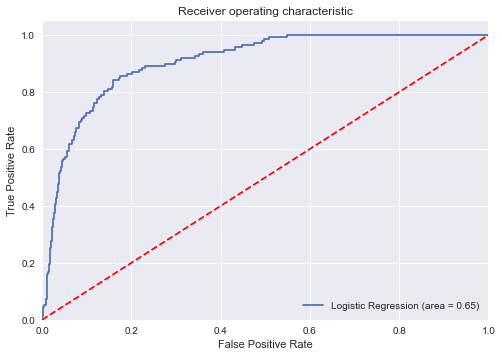

In [33]:
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('charts/logreg_roc.png')
plt.show()

In [34]:
mse, bias, var = bias_variance_decomp(logreg, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', random_seed=1)

print('MSE: %.3f' % mse)
print('Bias: %.3f' % bias)
print('Variance: %.3f' % var)

MSE: 0.102
Bias: 0.091
Variance: 0.011


In [35]:
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

array([[970,  23],
       [ 93,  45]])

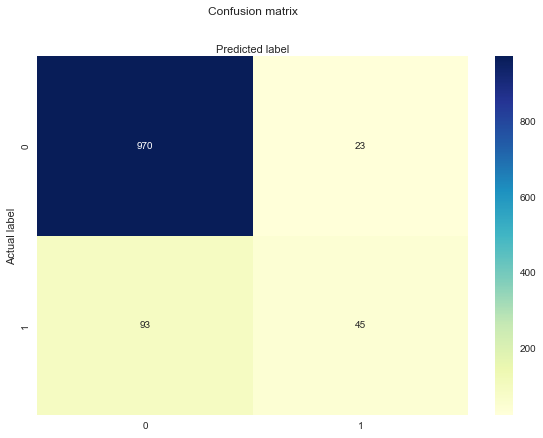

In [36]:
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.savefig('charts/logreg_confmatrix.png')

<br><h2>Decision Tree</h2>

In [37]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

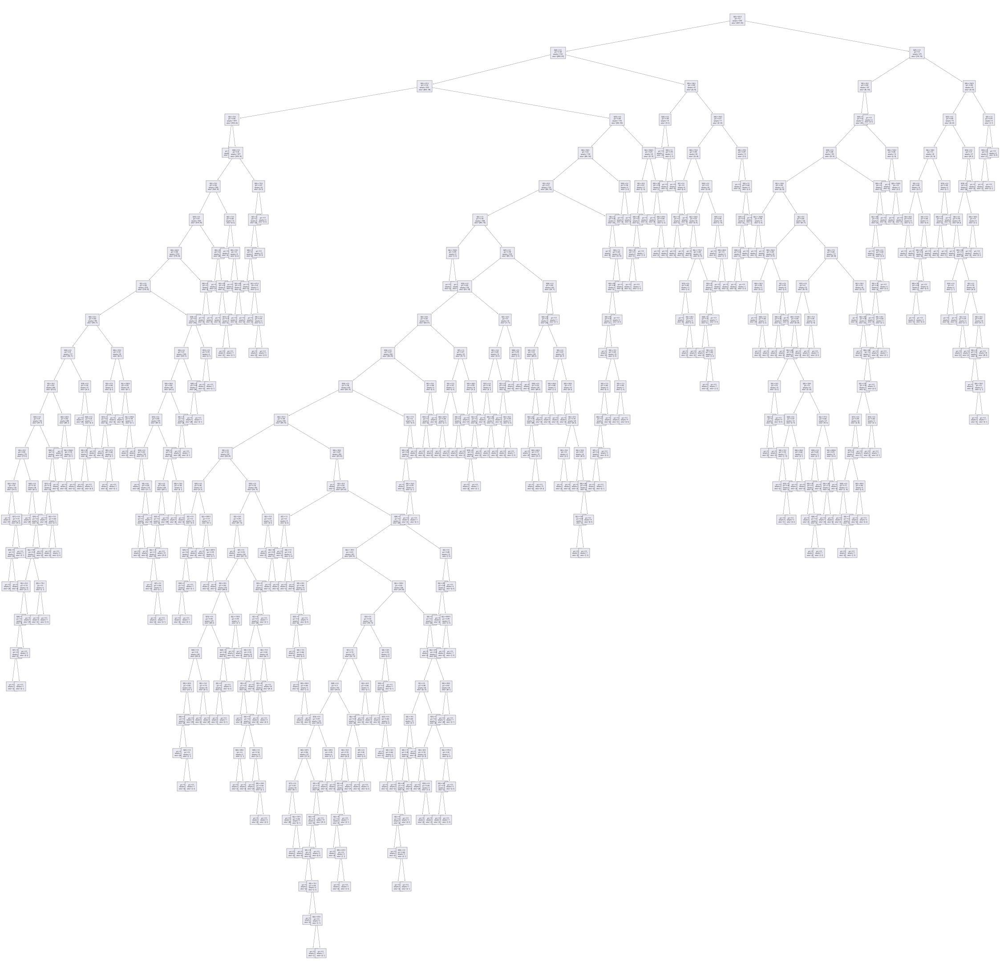

In [38]:
plt.figure(figsize=(40, 40))
tree.plot_tree(clf, fontsize=3)
plt.savefig('charts/tree.png', dpi=500)

In [39]:
clf_matrix = metrics.confusion_matrix(y_test, y_pred)
clf_matrix

array([[929,  64],
       [ 77,  61]])

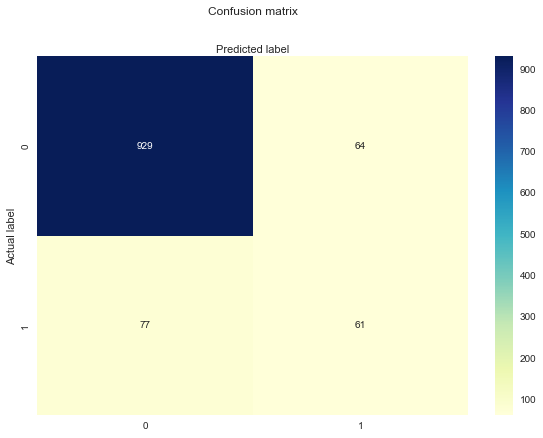

In [40]:
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(clf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.savefig('charts/tree_confmatrix.png')

In [41]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.8753315649867374
Precision: 0.488
Recall: 0.4420289855072464


In [42]:
mse, bias, var = bias_variance_decomp(clf, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', random_seed=1)

print('MSE: %.3f' % mse)
print('Bias: %.3f' % bias)
print('Variance: %.3f' % var)

MSE: 0.135
Bias: 0.070
Variance: 0.065
